In [10]:
from pathlib import Path

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_retrieval,
)

from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

In [3]:
images = Path("/home/yunho/guro_db_zed_colmap/images/")

outputs = Path("/home/yunho/guro_db_zed_colmap/outputs/sfm/")
sfm_pairs = outputs / "pairs-netvlad.txt"
sfm_dir = outputs / "sfm_superpoint+lightglue"

retrieval_conf = extract_features.confs["netvlad"]
feature_conf = extract_features.confs["superpoint_inloc"]
matcher_conf = match_features.confs["superpoint+lightglue"]

# Find image pairs via image retrieval

In [4]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=5)

[2024/03/26 15:58:51 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2024/03/26 15:58:51 hloc INFO] Found 2322 images in root /home/yunho/guro_db_zed_colmap/images.
/home/yunho/anaconda3/envs/hloc/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/yunho/anaconda3/envs/hloc/lib/python3.8/site-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda20CUDACachingAllocator9allocatorE'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


  0%|          | 0.00/529M [00:00<?, ?B/s]

100%|████████████████████████████████████████| 2322/2322 [00:23<00:00, 100.41it/s]
[2024/03/26 16:03:42 hloc INFO] Finished exporting features.
[2024/03/26 16:03:42 hloc INFO] Extracting image pairs from a retrieval database.
[2024/03/26 16:03:43 hloc INFO] Found 11610 pairs.


# Extract and match local features

In [5]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(
    matcher_conf, sfm_pairs, feature_conf["output"], outputs
)

[2024/03/26 16:03:48 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 4},
 'output': 'feats-superpoint-n4096-r1600',
 'preprocessing': {'grayscale': True, 'resize_max': 1600}}
[2024/03/26 16:03:48 hloc INFO] Found 2322 images in root /home/yunho/guro_db_zed_colmap/images.


Loaded SuperPoint model


100%|████████████████████████████████████████| 2322/2322 [00:10<00:00, 220.99it/s]
[2024/03/26 16:03:58 hloc INFO] Finished exporting features.
[2024/03/26 16:03:58 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}
/home/yunho/anaconda3/envs/hloc/lib/python3.8/site-packages/lightglue/lightglue.py:142: UserWarning: FlashAttention is not available. For optimal speed, consider installing torch >= 2.0 or flash-attn.
  self.inner_attn = Attention(flash)
Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/superpoint_lightglue.pth" to /home/yunho/.cache/torch/hub/checkpoints/superpoint_lightglue_v0-1_arxiv-pth


  0%|          | 0.00/45.3M [00:00<?, ?B/s]

100%|████████████████████████████████████████| 6605/6605 [00:33<00:00, 197.85it/s]
[2024/03/26 16:04:37 hloc INFO] Finished exporting matches.


# 3D reconstruction

In [6]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2024/03/26 16:04:55 hloc INFO] Creating an empty database...
[2024/03/26 16:04:55 hloc INFO] Importing images into the database...
[2024/03/26 16:05:04 hloc INFO] Importing features into the database...
100%|███████████████████████████████████████| 2322/2322 [00:00<00:00, 4887.61it/s]
[2024/03/26 16:05:04 hloc INFO] Importing matches into the database...
100%|█████████████████████████████████████| 11610/11610 [00:01<00:00, 6205.13it/s]
[2024/03/26 16:05:06 hloc INFO] Performing geometric verification of the matches...
[2024/03/26 16:05:07 hloc INFO] Running 3D reconstruction...
W0326 16:05:13.766242 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:13.769145 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:13.800735 1667664 levenberg_marquardt_strate

W0326 16:05:14.737037 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:14.756037 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:14.767151 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:14.778208 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:14.781836 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:14.800935 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:16.678614 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:16.698067 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:16.704620 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:16.724097 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:16.743872 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:16.750718 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:18.092844 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:18.100898 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:18.139436 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:18.147359 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:18.185719 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:18.193917 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:19.690403 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:19.700045 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:19.727705 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:19.737488 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:19.799826 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:19.827397 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:21.642876 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:21.654465 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:21.687803 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:21.699478 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:21.731784 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:21.764313 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:23.497426 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:23.509074 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:23.562129 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:23.573767 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:23.606468 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:23.618117 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 16:05:25.655804 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:25.669286 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:25.706457 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:25.719970 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:25.803303 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 16:05:25.816740 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 20:14:38.364446 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 20:14:38.365137 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 20:14:38.365224 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:30:39.939637 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:30:39.939761 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:30:39.940981 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 21:40:19.359560 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:40:19.359632 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:40:19.360230 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:40:19.360821 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:40:19.360886 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:40:19.361485 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 21:59:44.667955 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:59:44.668139 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:59:44.668917 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:59:44.669693 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:59:44.669871 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 21:59:44.670637 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 22:02:05.819092 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:02:05.819197 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:02:05.821058 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:02:05.821156 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:02:05.822089 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:02:05.823112 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 22:04:00.935149 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:04:00.935261 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:04:01.188089 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:04:01.188207 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:04:01.190213 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:04:01.191272 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0326 22:06:03.328734 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:07:55.220821 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:07:55.220886 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:07:55.222023 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:07:55.222084 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0326 22:07:55.223217 1667664 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

In [23]:
opts = dict(camera_model='SIMPLE_PINHOLE', camera_params=','.join(map(str, (263.27886962890625, 325.6990051269531, 180.189453125))))
model_pinhole = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path, image_options=opts, mapper_options=dict(ba_refine_focal_length=False, ba_refine_extra_params=False))

[2024/03/27 20:53:09 hloc WARNING] The database already exists, deleting it.
[2024/03/27 20:53:09 hloc INFO] Creating an empty database...
[2024/03/27 20:53:09 hloc INFO] Importing images into the database...
[2024/03/27 20:53:18 hloc INFO] Importing features into the database...
100%|███████████████████████████████████████| 2322/2322 [00:00<00:00, 4923.51it/s]
[2024/03/27 20:53:18 hloc INFO] Importing matches into the database...
100%|█████████████████████████████████████| 11610/11610 [00:01<00:00, 6097.91it/s]
[2024/03/27 20:53:20 hloc INFO] Performing geometric verification of the matches...
[2024/03/27 20:53:22 hloc INFO] Running 3D reconstruction...
W0327 20:54:39.420850 1807420 levenberg_marquardt_strategy.cc:126] Linear solver failure. Failed to compute a finite step.
W0327 20:54:39.421196 1807420 levenberg_marquardt_strategy.cc:126] Linear solver failure. Failed to compute a finite step.
W0327 20:54:43.779292 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. F

W0327 21:17:14.914686 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:17:14.914907 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:17:14.914938 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:17:14.915524 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:17:14.915555 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:17:14.915767 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0327 21:34:26.925351 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:34:26.926510 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:34:26.926589 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:34:26.926667 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:56:13.033730 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 21:56:13.237987 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0327 22:00:22.075490 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:00:22.076231 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:00:22.076615 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:00:22.077008 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:00:22.459900 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:00:22.459944 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

W0327 22:14:04.199064 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:14:04.200984 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:14:04.201069 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:14:04.202961 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:14:04.203044 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0327 22:14:04.204939 1807420 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compu

# Visualization

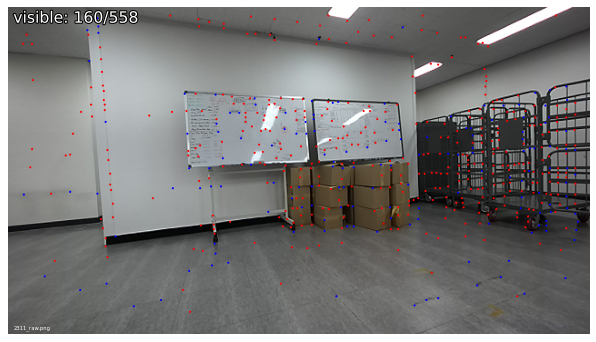

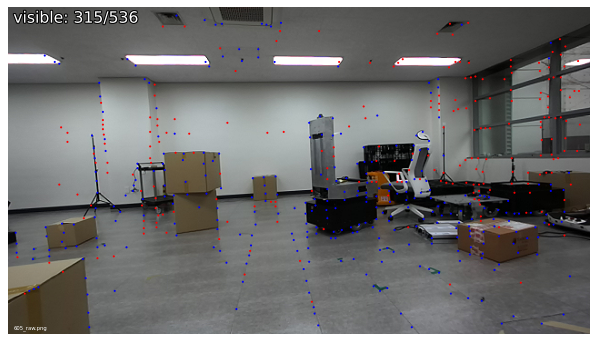

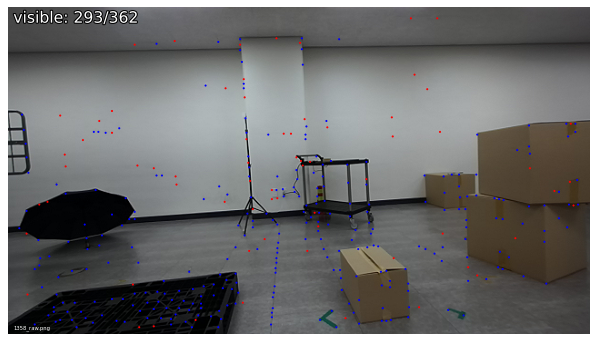

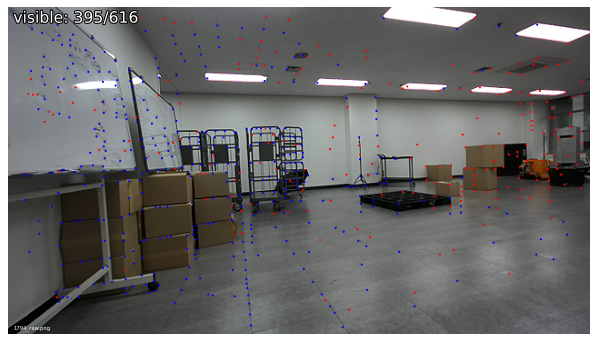

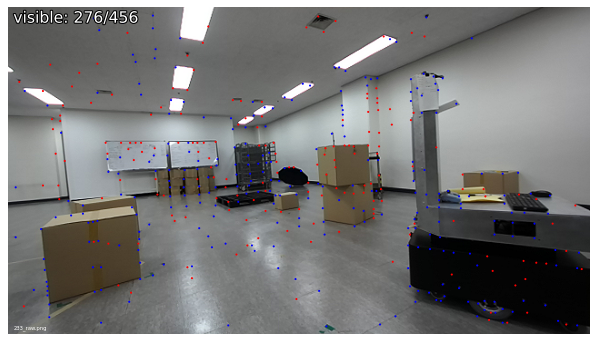

In [24]:
visualization.visualize_sfm_2d(model_pinhole, images, color_by="visibility", n=5)

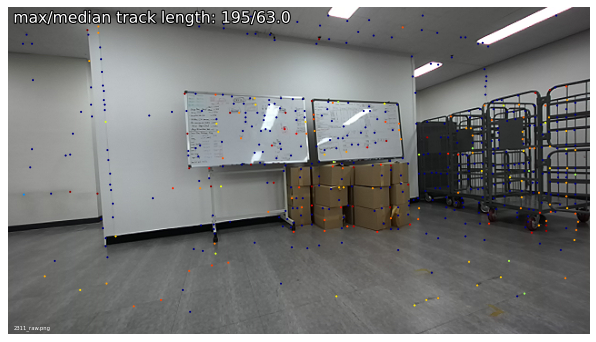

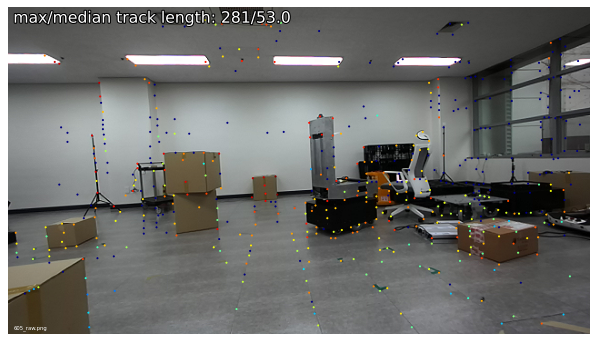

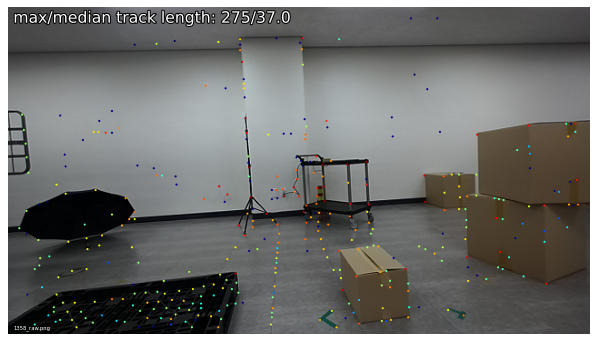

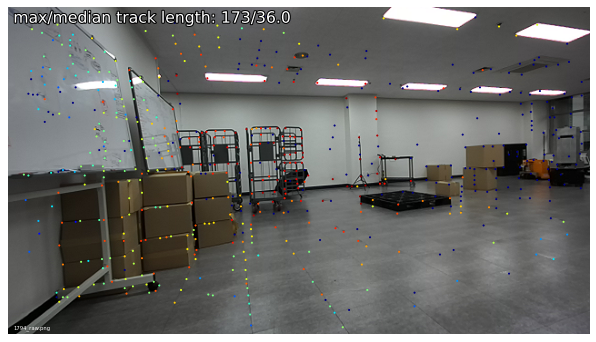

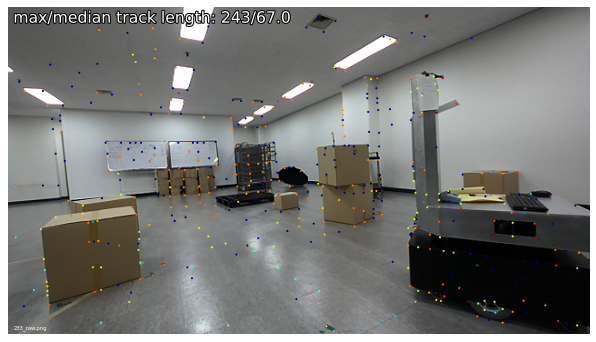

In [25]:
visualization.visualize_sfm_2d(model_pinhole, images, color_by="track_length", n=5)

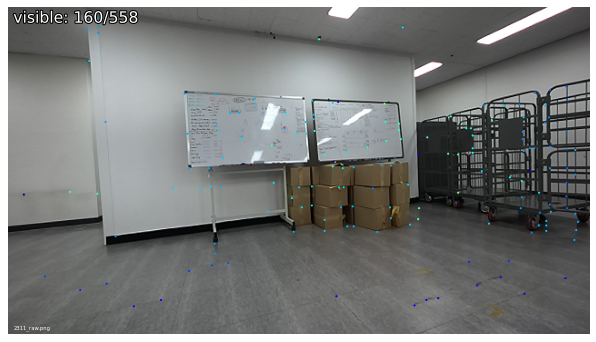

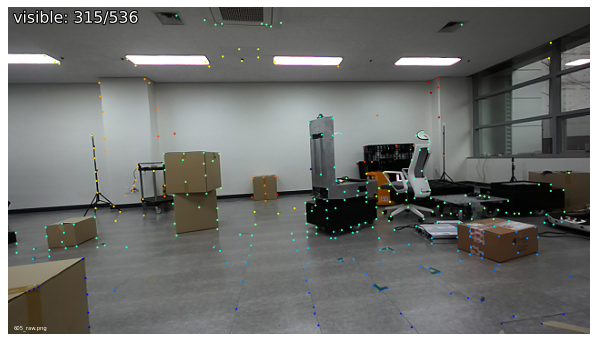

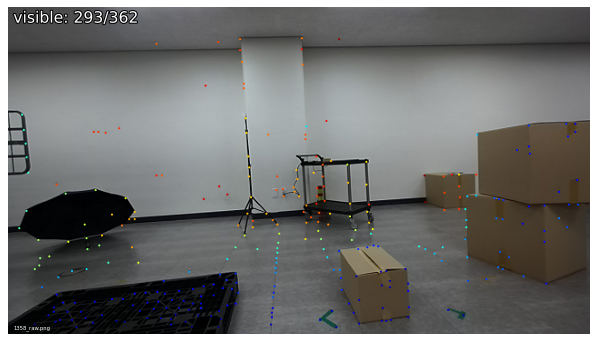

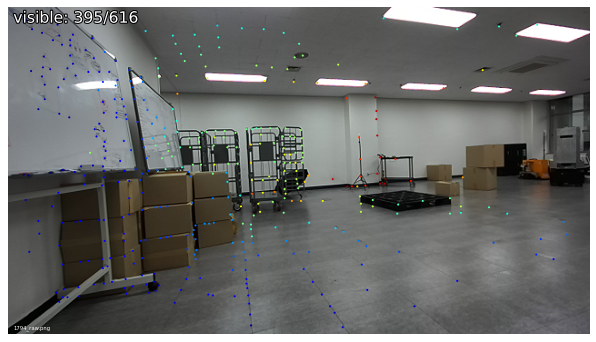

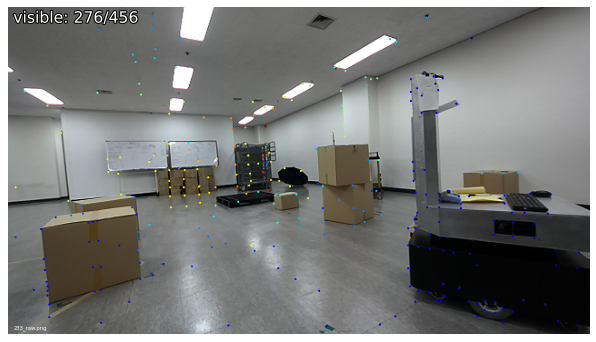

In [26]:
visualization.visualize_sfm_2d(model_pinhole, images, color_by="depth", n=5)

In [27]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model_pinhole, color='rgba(255,0,0,0.5)', name="mapping", points_rgb=True)
fig.show()

In [28]:
model_pinhole.export_PLY("ccc.ply")